In [ ]:
!pip install openpyxl


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
file_path = '/content/drive/My Drive/CSE6242 project/U.S._Chronic_Disease_Indicators__CDI__20240221.csv'

In [ ]:
df = pd.read_csv(file_path)

<ipython-input-3-47c250c455f0>:1: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [ ]:
# hospital number & population
hospital_population = pd.read_excel('/content/drive/My Drive/CSE6242 project/hospital_number&population_by_states.xlsx')

In [ ]:
# hospital_population.to_csv('/content/drive/My Drive/CSE6242 project/hospital_number&population_by_states.csv')

In [ ]:
df.columns

Index(['YearStart', 'YearEnd', 'LocationAbbr', 'LocationDesc', 'DataSource',
       'Topic', 'Question', 'Response', 'DataValueUnit', 'DataValueType',
       'DataValue', 'DataValueAlt', 'DataValueFootnoteSymbol',
       'DatavalueFootnote', 'LowConfidenceLimit', 'HighConfidenceLimit',
       'StratificationCategory1', 'Stratification1', 'StratificationCategory2',
       'Stratification2', 'StratificationCategory3', 'Stratification3',
       'GeoLocation', 'ResponseID', 'LocationID', 'TopicID', 'QuestionID',
       'DataValueTypeID', 'StratificationCategoryID1', 'StratificationID1',
       'StratificationCategoryID2', 'StratificationID2',
       'StratificationCategoryID3', 'StratificationID3'],
      dtype='object')

In [ ]:
len(df)

1185676

In [ ]:
df = df[df['YearStart'] == df['YearEnd']] # only include entries that start and end in the same year
# eliminate rows that have no available data or is NaN
df = df[df['DatavalueFootnote'] != "No data available"]
df = df.dropna(subset=['DataValue'])
# df = df[df["DataValueType"]=="Number"]
# df = df[df["DataSource"] == "BRFSS"]
df

,YearStart,YearEnd,LocationAbbr,LocationDesc,DataSource,Topic,Question,Response,DataValueUnit,DataValueType,...,LocationID,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
0,2014,2014,AR,Arkansas,SEDD; SID,Asthma,Hospitalizations for asthma,NaN,NaN,Number,...,5,AST,AST3_1,NMBR,GENDER,GENM,NaN,NaN,NaN,NaN
1,2018,2018,CO,Colorado,SEDD; SID,Asthma,Hospitalizations for asthma,NaN,NaN,Number,...,8,AST,AST3_1,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
2,2018,2018,DC,District of Columbia,SEDD; SID,Asthma,Hospitalizations for asthma,NaN,NaN,Number,...,11,AST,AST3_1,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
3,2017,2017,GA,Georgia,SEDD; SID,Asthma,Hospitalizations for asthma,NaN,NaN,Number,...,13,AST,AST3_1,NMBR,GENDER,GENF,NaN,NaN,NaN,NaN
4,2010,2010,MI,Michigan,SEDD; SID,Asthma,Hospitalizations for asthma,NaN,NaN,Number,...,26,AST,AST3_1,NMBR,RACE,HIS,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185666,2017,2017,VT,Vermont,BRFSS,Arthritis,Activity limitation due to arthritis among adu...,NaN,%,Crude Prevalence,...,50,ART,ART2_1,CRDPREV,RACE,OTH,NaN,NaN,NaN,NaN
1185668,2019,2019,ME,Maine,BRFSS,Arthritis,Activity limitation due to arthritis among adu...,NaN,%,Crude Prevalence,...,23,ART,ART2_1,CRDPREV,RACE,MRC,NaN,NaN,NaN,NaN
1185670,2019,2019,OK,Oklahoma,BRFSS,Arthritis,Activity limitation due to arthritis among adu...,NaN,%,Crude Prevalence,...,40,ART,ART2_1,CRDPREV,RACE,OTH,NaN,NaN,NaN,NaN
1185672,2020,2020,WY,Wyoming,BRFSS,Older Adults,Proportion of older adults aged >= 65 years wh...,NaN,%,Crude Prevalence,...,56,OLD,OLD3_1,CRDPREV,RACE,WHT,NaN,NaN,NaN,NaN


In [ ]:
# clean the 2007 - 2021 dataset
 # (I took off column `geo location` because the 2022_dataset does not have it, but i think it is kinda important for our dashboard)
columns_selected = ['YearStart', 'YearEnd', 'LocationAbbr','LocationDesc','LocationID','StratificationCategoryID1','StratificationID1','Topic','TopicID', 'Question','QuestionID','DataValueType','DataValueTypeID','DataValueUnit','LowConfidenceLimit','HighConfidenceLimit', 'DataValueAlt']
df_TextCleaned = df[columns_selected]

In [ ]:
# clean the 2022 dataset
file_path_2022 = "/content/drive/My Drive/CSE6242 project/data_for_2022.csv"
df_2022 = pd.read_csv(file_path_2022)
df_2022 = df_2022.dropna(subset=['DataValue'])
df_2022 = df_2022[columns_selected]
# df_test = df_2022[df_2022["DataValueUnit"]!= "%"]
# df_test
df_2022

,YearStart,YearEnd,LocationAbbr,LocationDesc,LocationID,StratificationCategoryID1,StratificationID1,Topic,TopicID,Question,QuestionID,DataValueType,DataValueTypeID,DataValueUnit,LowConfidenceLimit,HighConfidenceLimit,DataValueAlt
0,2022,2022,AZ,Arizona,4,SEX,SEXF,Arthritis,ART,Arthritis among adults,ART01,Crude Prevalence,CRDPREV,%,27.2,31.0,29.1
1,2022,2022,GU,Guam,66,OVERALL,OVR,Arthritis,ART,Arthritis among adults,ART01,Crude Prevalence,CRDPREV,%,16.3,23.2,19.5
2,2022,2022,KY,Kentucky,21,SEX,SEXF,Diabetes,DIA,Diabetes among adults,DIA01,Crude Prevalence,CRDPREV,%,13.2,17.3,15.1
3,2022,2022,KY,Kentucky,21,SEX,SEXM,Mental Health,MEN,Depression among adults,MEN02,Crude Prevalence,CRDPREV,%,16.1,21.0,18.4
4,2022,2022,MI,Michigan,26,SEX,SEXM,Arthritis,ART,Arthritis among adults,ART01,Crude Prevalence,CRDPREV,%,23.5,26.4,24.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47119,2022,2022,VT,Vermont,50,AGE,AGE1844,Mental Health,MEN,Average mentally unhealthy days among adults,MEN04,Crude Mean,CRDMEAN,Number,6.6,7.7,7.2
47120,2022,2022,VA,Virginia,51,RACE,MRC,"Nutrition, Physical Activity, and Weight Status",NPAW,Obesity among adults,NPW14,Age-adjusted Prevalence,AGEADJPREV,%,24.2,40.0,31.6
47121,2022,2022,WA,Washington,53,AGE,AGE65P,Sleep,SLEP,Short sleep duration among adults,SLP03,Crude Prevalence,CRDPREV,%,24.1,26.6,25.3
47123,2022,2022,VI,Virgin Islands,78,SEX,SEXM,Mental Health,MEN,Frequent mental distress among adults,MEN05,Crude Prevalence,CRDPREV,%,4.6,14.5,8.3


## Combine pre 2022 and 2022 data

In [ ]:
# # Combined dataset, for exploration only
# combined_df_initial = pd.concat([df_TextCleaned,df_2022])
# combined_df_initial = combined_df_initial.sort_values(by=['YearStart','LocationAbbr','Topic','Question','StratificationID1','DataValueType'])
# combined_df_initial

In [ ]:
# # For exploration only
# combined_df_initial.describe()

In [ ]:
# concatenate two dataset together
combined_df = pd.concat([df_TextCleaned,df_2022])
combined_df = combined_df[['LocationAbbr','LocationDesc','LocationID','Topic','TopicID','YearStart', 'YearEnd','StratificationCategoryID1','StratificationID1', 'Question','QuestionID','DataValueType','DataValueTypeID','DataValueUnit','LowConfidenceLimit','HighConfidenceLimit', 'DataValueAlt']]
combined_df = combined_df.sort_values(by=['LocationAbbr','Topic','YearStart','Question','StratificationID1','DataValueType']) # organize data based on 'LocationAbbr','YearStart','Topic','Question','StratificationID1','DataValueType'
combined_df['Question'] = combined_df['Question'].str.lower() # make Questions lower_case
combined_df = combined_df[combined_df['StratificationID1'] == 'OVR'] # exclude those that have been layered off --> GENM, GENF, etc
combined_df


,LocationAbbr,LocationDesc,LocationID,Topic,TopicID,YearStart,YearEnd,StratificationCategoryID1,StratificationID1,Question,QuestionID,DataValueType,DataValueTypeID,DataValueUnit,LowConfidenceLimit,HighConfidenceLimit,DataValueAlt
1748,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Age-adjusted Rate,AGEADJRATE,"cases per 100,000",7.5,12.6,9.8
14682,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",7.7,12.5,9.9
10121,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Number,NMBR,NaN,NaN,NaN,70.0
26165,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,per capita alcohol consumption among persons a...,ALC7_0,Per capita alcohol consumption,PERCAPALC,gallons,NaN,NaN,3.0
538773,AK,Alaska,2,Alcohol,ALC,2011,2011,OVERALL,OVR,binge drinking frequency among adults aged >= ...,ALC3_0,Age-adjusted Mean,AGEADJMEAN,Number,3.8,5.5,4.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522220,WY,Wyoming,56,Tobacco,TOB,2021,2021,OVERALL,OVR,proportion of the population protected by a co...,TOB6_0,Percent,PRCT,%,NaN,NaN,0.3
519916,WY,Wyoming,56,Tobacco,TOB,2021,2021,OVERALL,OVR,states that allow stronger local tobacco contr...,TOB4_0,Yes/No,YESNO,NaN,NaN,NaN,NaN
521321,WY,Wyoming,56,Tobacco,TOB,2021,2021,OVERALL,OVR,states with strong polices that require retail...,TOB5_0,Yes/No,YESNO,NaN,NaN,NaN,NaN
44002,WY,Wyoming,56,Tobacco,TOB,2022,2022,OVERALL,OVR,current cigarette smoking among adults,TOB04,Age-adjusted Prevalence,AGEADJPREV,%,14.4,17.6,15.9


In [ ]:
# Unique data value types
combined_df.DataValueType.unique()

array(['Age-adjusted Rate', 'Crude Rate', 'Number',
       'Per capita alcohol consumption', 'Age-adjusted Mean', 'Mean',
       'Age-adjusted Prevalence', 'Crude Prevalence',
       'Commercial host (dram shop) liability status for alcohol service',
       'US Dollars',
       'Local control of the regulation of alcohol outlet density',
       'Crude 75th percentile', 'Crude Median',
       'Adjusted by age, sex, race and ethnicity', 'Prevalence',
       'Crude Mean', 'Yes/No', 'Percent', 'Median'], dtype=object)

In [ ]:
# Unique topics in pre-2022 data
df_TextCleaned.Topic.unique()

array(['Asthma', 'Chronic Kidney Disease',
       'Chronic Obstructive Pulmonary Disease', 'Cardiovascular Disease',
       'Diabetes', 'Disability', 'Reproductive Health', 'Alcohol',
       'Arthritis', 'Tobacco',
       'Nutrition, Physical Activity, and Weight Status', 'Older Adults',
       'Oral Health', 'Overarching Conditions', 'Cancer', 'Immunization',
       'Mental Health'], dtype=object)

In [ ]:
# Unique topics in 2022 data
df_2022.Topic.unique()

array(['Arthritis', 'Diabetes', 'Mental Health', 'Asthma',
       'Health Status', 'Disability', 'Alcohol', 'Sleep', 'Cancer',
       'Nutrition, Physical Activity, and Weight Status', 'Oral Health',
       'Social Determinants of Health', 'Immunization',
       'Chronic Obstructive Pulmonary Disease', 'Tobacco'], dtype=object)

In [ ]:
# Remove topics that are not available pre-2022: Health Status, Sleep, Social Determinants of Health
combined_df = combined_df[(combined_df["Topic"] != 'Health Status') & (combined_df["Topic"] != 'Sleep') & (combined_df["Topic"] != 'Social Determinants of Health')]
combined_df

,LocationAbbr,LocationDesc,LocationID,Topic,TopicID,YearStart,YearEnd,StratificationCategoryID1,StratificationID1,Question,QuestionID,DataValueType,DataValueTypeID,DataValueUnit,LowConfidenceLimit,HighConfidenceLimit,DataValueAlt
1748,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Age-adjusted Rate,AGEADJRATE,"cases per 100,000",7.5,12.6,9.8
14682,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",7.7,12.5,9.9
10121,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Number,NMBR,NaN,NaN,NaN,70.0
26165,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,per capita alcohol consumption among persons a...,ALC7_0,Per capita alcohol consumption,PERCAPALC,gallons,NaN,NaN,3.0
538773,AK,Alaska,2,Alcohol,ALC,2011,2011,OVERALL,OVR,binge drinking frequency among adults aged >= ...,ALC3_0,Age-adjusted Mean,AGEADJMEAN,Number,3.8,5.5,4.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522220,WY,Wyoming,56,Tobacco,TOB,2021,2021,OVERALL,OVR,proportion of the population protected by a co...,TOB6_0,Percent,PRCT,%,NaN,NaN,0.3
519916,WY,Wyoming,56,Tobacco,TOB,2021,2021,OVERALL,OVR,states that allow stronger local tobacco contr...,TOB4_0,Yes/No,YESNO,NaN,NaN,NaN,NaN
521321,WY,Wyoming,56,Tobacco,TOB,2021,2021,OVERALL,OVR,states with strong polices that require retail...,TOB5_0,Yes/No,YESNO,NaN,NaN,NaN,NaN
44002,WY,Wyoming,56,Tobacco,TOB,2022,2022,OVERALL,OVR,current cigarette smoking among adults,TOB04,Age-adjusted Prevalence,AGEADJPREV,%,14.4,17.6,15.9


In [ ]:
# # Check if duplicates exist for each 'YearStart','LocationDesc','Topic','Question','DataValueType'; for exploration only
# combined_df.groupby(['YearStart','LocationDesc','Topic','Question','DataValueType']).size()

In [ ]:
# save the df into csv
combined_df.to_csv('/content/drive/My Drive/CSE6242 project/combined_data.csv', index=True)

## Separate dataset for mortality and incidence

1. Mortality

In [ ]:
# All mortality rate data (use crude rate only)
combined_df_mortality = combined_df[(combined_df['Question'].str.contains('mortality')) & (combined_df['DataValueType'] == 'Crude Rate')]
combined_df_mortality
# combined_df_mortality.groupby(['YearStart','LocationDesc','Topic','Question']).size()

,LocationAbbr,LocationDesc,LocationID,Topic,TopicID,YearStart,YearEnd,StratificationCategoryID1,StratificationID1,Question,QuestionID,DataValueType,DataValueTypeID,DataValueUnit,LowConfidenceLimit,HighConfidenceLimit,DataValueAlt
14682,AK,Alaska,2,Alcohol,ALC,2010,2010,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",7.7,12.5,9.9
2166,AK,Alaska,2,Alcohol,ALC,2011,2011,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",11.1,16.7,13.7
15624,AK,Alaska,2,Alcohol,ALC,2012,2012,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",9.8,15.0,12.2
13310,AK,Alaska,2,Alcohol,ALC,2013,2013,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",8.9,13.8,11.2
13687,AK,Alaska,2,Alcohol,ALC,2014,2014,OVERALL,OVR,chronic liver disease mortality,ALC6_0,Crude Rate,CRDRATE,"cases per 100,000",9.1,14.1,11.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
516093,WY,Wyoming,56,Overarching Conditions,OVC,2016,2016,OVERALL,OVR,premature mortality among adults aged 45-64 years,OVC5_0,Crude Rate,CRDRATE,"cases per 100,000",598.2,679.0,638.6
510690,WY,Wyoming,56,Overarching Conditions,OVC,2017,2017,OVERALL,OVR,premature mortality among adults aged 45-64 years,OVC5_0,Crude Rate,CRDRATE,"cases per 100,000",618.6,701.6,660.1
505962,WY,Wyoming,56,Overarching Conditions,OVC,2018,2018,OVERALL,OVR,premature mortality among adults aged 45-64 years,OVC5_0,Crude Rate,CRDRATE,"cases per 100,000",621.3,705.3,663.3
507047,WY,Wyoming,56,Overarching Conditions,OVC,2019,2019,OVERALL,OVR,premature mortality among adults aged 45-64 years,OVC5_0,Crude Rate,CRDRATE,"cases per 100,000",625.2,710.0,667.6


In [ ]:
# Export mortality dataset
combined_df_mortality.to_csv("/content/drive/My Drive/CSE6242 project/mortality_data.csv", index=False)

2. Incidence

In [ ]:
# All non-mortality data
combined_df_incidence = combined_df[~combined_df['Question'].str.contains('mortality')]
combined_df_incidence.Topic.unique()
# combined_df_incidence[['LocationAbbr', 'YearStart','Topic']].groupby(['LocationAbbr', 'YearStart']).nunique()

array(['Alcohol', 'Arthritis', 'Asthma', 'Cancer',
       'Cardiovascular Disease', 'Chronic Kidney Disease',
       'Chronic Obstructive Pulmonary Disease', 'Diabetes', 'Disability',
       'Immunization', 'Mental Health',
       'Nutrition, Physical Activity, and Weight Status', 'Older Adults',
       'Oral Health', 'Overarching Conditions', 'Reproductive Health',
       'Tobacco'], dtype=object)

In [ ]:
# All non-mortality data about incidence (crude prevalence & number only)
QuestionID_incidence = ['ALC5_1','ALC06','ART1_1','ART01','AST1_1','AST02','CKD3_0','COPD2_0','COPD01','DIA2_1','DIA01','DIS1_0','DIS01','MTH2_0','MEN02','NPAW1_1','NPAW10_0','NPW06','NPW14','OLD1_0','OLD4_0','ORH4_1','ORH4_2','ORH03','ORH02','TOB2_2','TOB04']
combined_df_incidence = pd.concat([combined_df_incidence[combined_df_incidence['QuestionID'].isin(QuestionID_incidence) & (combined_df_incidence['DataValueTypeID'] == 'CRDPREV')]
                                   , combined_df_incidence[combined_df_incidence['QuestionID'].isin(QuestionID_incidence) & (combined_df_incidence['DataValueTypeID'] == 'NMBR')]])
combined_df_incidence


,LocationAbbr,LocationDesc,LocationID,Topic,TopicID,YearStart,YearEnd,StratificationCategoryID1,StratificationID1,Question,QuestionID,DataValueType,DataValueTypeID,DataValueUnit,LowConfidenceLimit,HighConfidenceLimit,DataValueAlt
533994,AK,Alaska,2,Alcohol,ALC,2011,2011,OVERALL,OVR,heavy drinking among adults aged >= 18 years,ALC5_1,Crude Prevalence,CRDPREV,%,6.2,8.7,7.4
537339,AK,Alaska,2,Alcohol,ALC,2012,2012,OVERALL,OVR,heavy drinking among adults aged >= 18 years,ALC5_1,Crude Prevalence,CRDPREV,%,5.6,7.8,6.6
533883,AK,Alaska,2,Alcohol,ALC,2013,2013,OVERALL,OVR,heavy drinking among adults aged >= 18 years,ALC5_1,Crude Prevalence,CRDPREV,%,7.1,9.5,8.2
537036,AK,Alaska,2,Alcohol,ALC,2014,2014,OVERALL,OVR,heavy drinking among adults aged >= 18 years,ALC5_1,Crude Prevalence,CRDPREV,%,7.7,10.1,8.8
538740,AK,Alaska,2,Alcohol,ALC,2015,2015,OVERALL,OVR,heavy drinking among adults aged >= 18 years,ALC5_1,Crude Prevalence,CRDPREV,%,7.0,10.4,8.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
480986,WY,Wyoming,56,Older Adults,OLD,2016,2016,OVERALL,OVR,hospitalization for hip fracture among medicar...,OLD1_0,Number,NMBR,NaN,NaN,NaN,455.0
475896,WY,Wyoming,56,Older Adults,OLD,2017,2017,OVERALL,OVR,hospitalization for hip fracture among medicar...,OLD1_0,Number,NMBR,NaN,NaN,NaN,440.0
480044,WY,Wyoming,56,Older Adults,OLD,2018,2018,OVERALL,OVR,hospitalization for hip fracture among medicar...,OLD1_0,Number,NMBR,NaN,NaN,NaN,476.0
487404,WY,Wyoming,56,Older Adults,OLD,2019,2019,OVERALL,OVR,hospitalization for hip fracture among medicar...,OLD1_0,Number,NMBR,NaN,NaN,NaN,504.0


In [ ]:
# Diseases with prevelance data
combined_df_incidence.Topic.unique()

# Topics/Diseases without prevelance data: Cancer, Cardiovascular Disease, Immunization, Overarching Conditions, Reproductive Health

array(['Alcohol', 'Arthritis', 'Asthma', 'Chronic Kidney Disease',
       'Chronic Obstructive Pulmonary Disease', 'Diabetes', 'Disability',
       'Mental Health', 'Nutrition, Physical Activity, and Weight Status',
       'Older Adults', 'Oral Health', 'Tobacco'], dtype=object)

In [ ]:
# Export incidence dataset
combined_df_incidence.to_csv("/content/drive/My Drive/CSE6242 project/incidence_data.csv", index=False)

# EDA

Wisconsin               2685
Nebraska                2673
Kentucky                2660
North Carolina          2640
Iowa                    2635
Arizona                 2626
Maryland                2618
Michigan                2613
Arkansas                2595
New Mexico              2594
Nevada                  2591
South Carolina          2570
West Virginia           2565
Minnesota               2559
Georgia                 2546
Rhode Island            2545
New York                2537
Oregon                  2533
Colorado                2532
Massachusetts           2529
New Jersey              2527
Washington              2526
Vermont                 2518
Florida                 2516
Hawaii                  2511
Utah                    2508
South Dakota            2498
Oklahoma                2473
Maine                   2466
Tennessee               2463
Mississippi             2462
District of Columbia    2462
Virginia                2459
Missouri                2459
Pennsylvania  

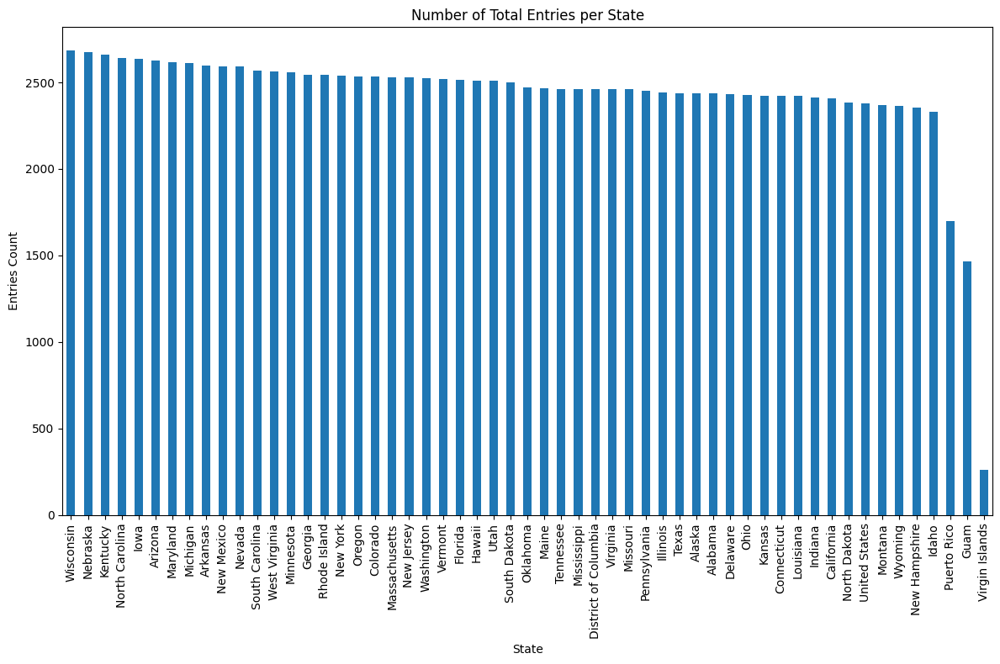

In [ ]:
import matplotlib.pyplot as plt
# Perform a simple count of entries per state
state_counts = combined_df['LocationDesc'].value_counts()
state_year_group = combined_df.groupby(['LocationDesc', 'YearStart']).size()
print(state_counts)
print(state_year_group)
plt.figure(figsize=(12, 8))

# Create a bar plot
state_counts.plot(kind='bar')

# Rotate the x-axis labels to be vertical
plt.xticks(rotation=90)

# Add labels and title
plt.xlabel('State')
plt.ylabel('Entries Count')
plt.title('Number of Total Entries per State')

# Use a tight layout to ensure everything fits without overlapping
plt.tight_layout()

# Show the plot
plt.show()

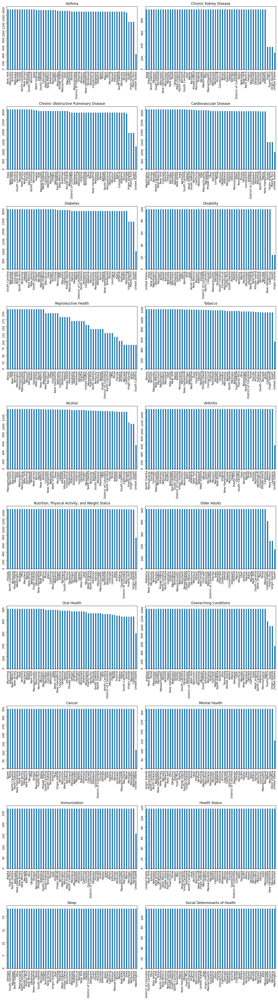

In [ ]:
# get plots for different diseases grouped by states
# Get a list of unique diseases
unique_diseases = combined_df['Topic'].unique()

# Set up the matplotlib figure and axes
n_rows = len(unique_diseases) // 2 + len(unique_diseases) % 2
fig, axes = plt.subplots(n_rows, 2, figsize=(14, 5 * n_rows))  # Adjust the size as needed
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Loop through each disease and create a bar plot for each one
for i, disease in enumerate(unique_diseases):
    # Filter the DataFrame for the current disease
    disease_data = combined_df[combined_df['Topic'] == disease]

    # Perform a count of entries per state for the current disease
    state_counts = disease_data['LocationDesc'].value_counts()

    # Create the bar plot on the appropriate subplot
    state_counts.plot(kind='bar', ax=axes[i])

    # Set the title for the subplot to the name of the disease
    axes[i].set_title(disease)

    # Rotate the x-axis labels to be vertical if necessary
    axes[i].tick_params(labelrotation=90)

# Adjust the layout so that plots don't overlap
plt.tight_layout()

# Show the plot
plt.show()

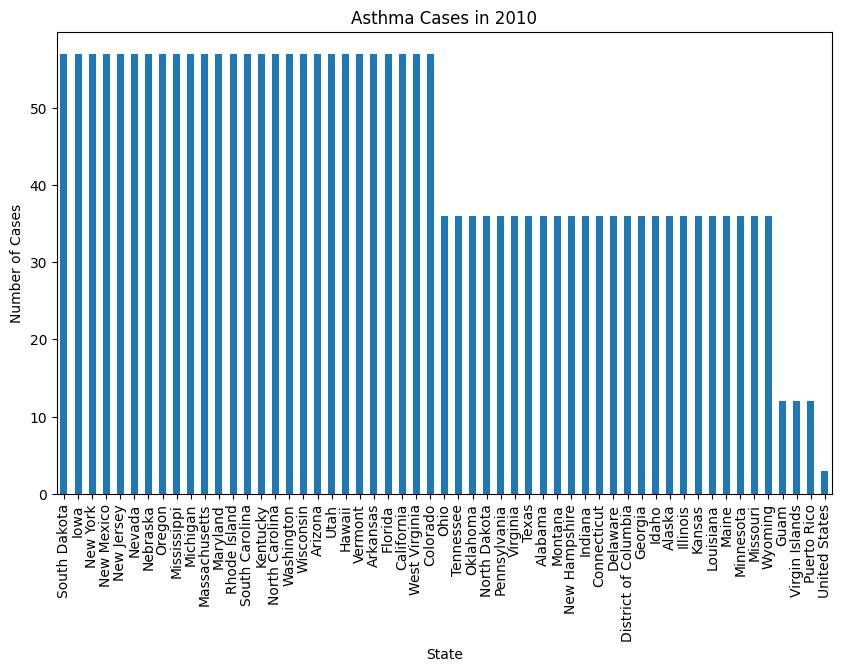

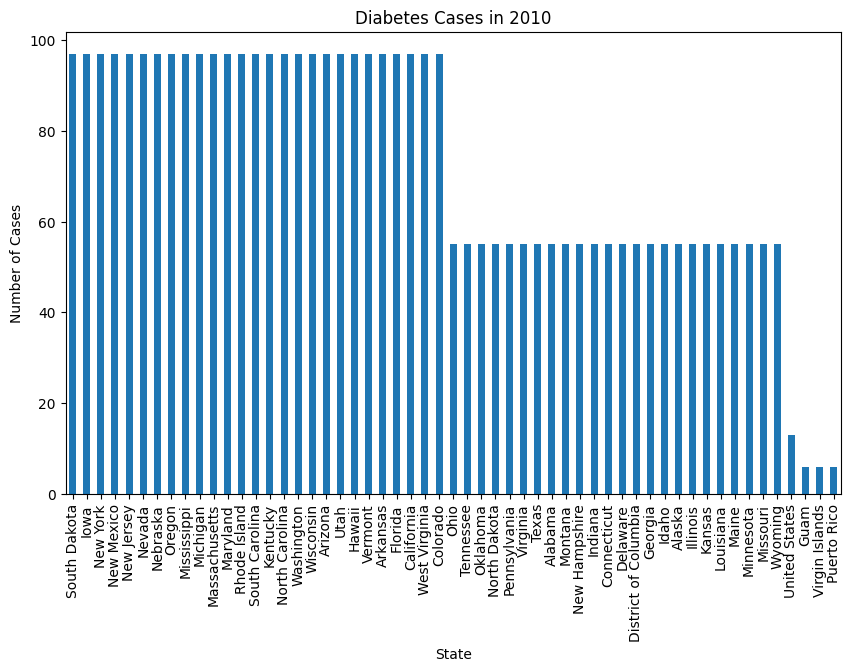

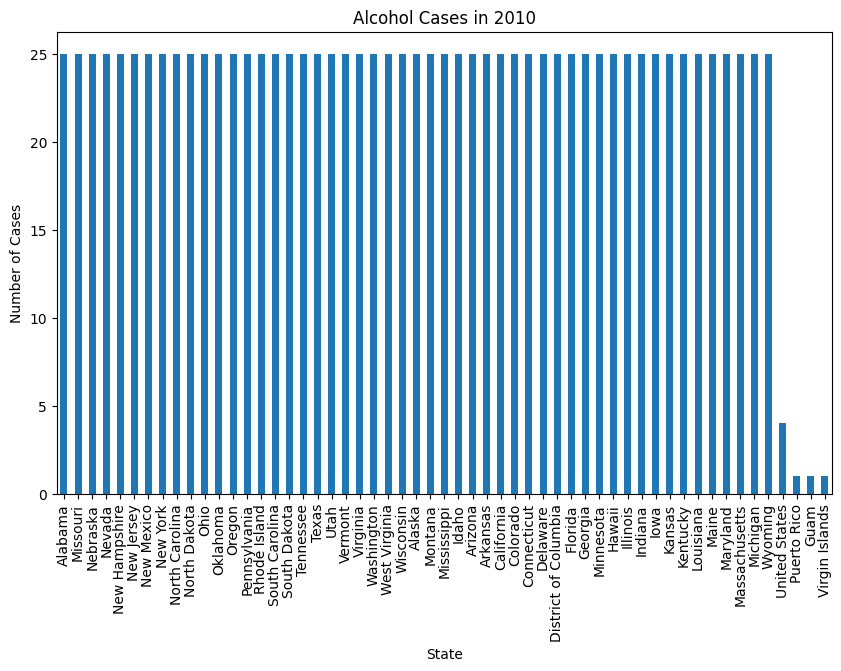

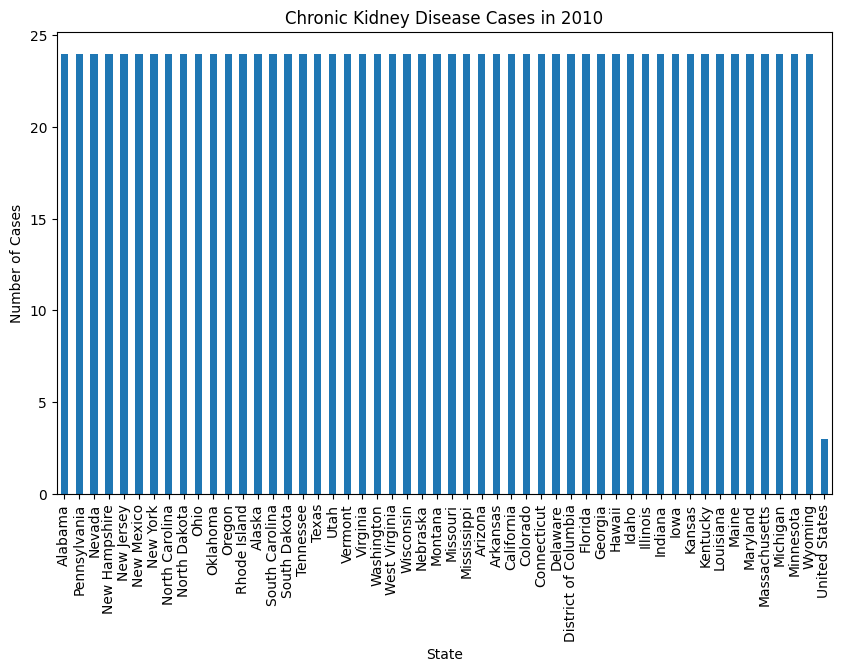

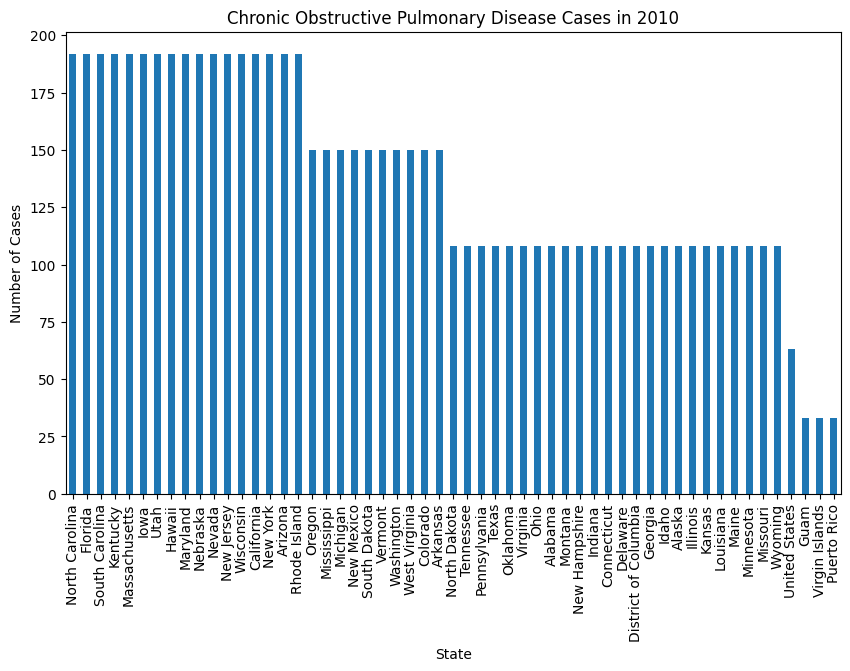

...

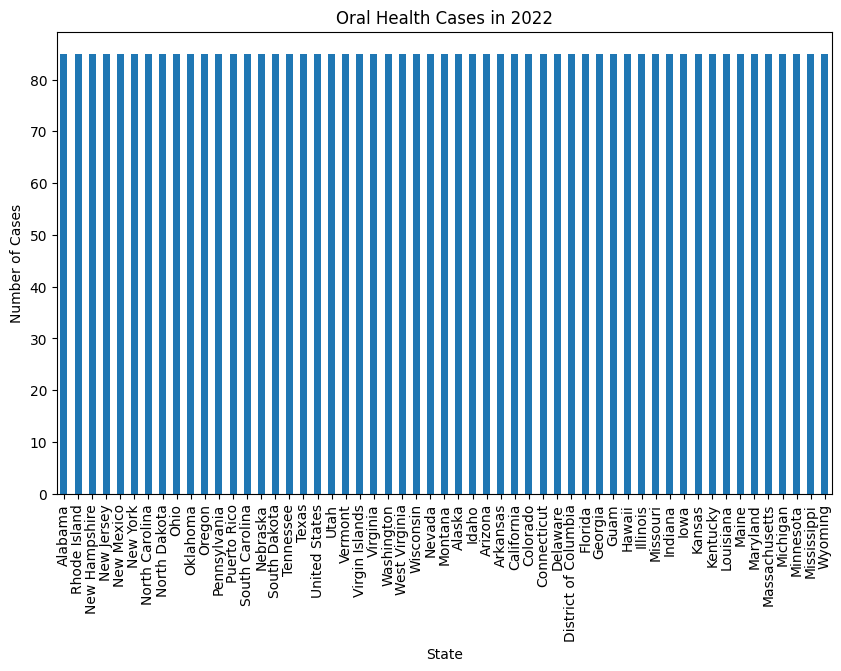

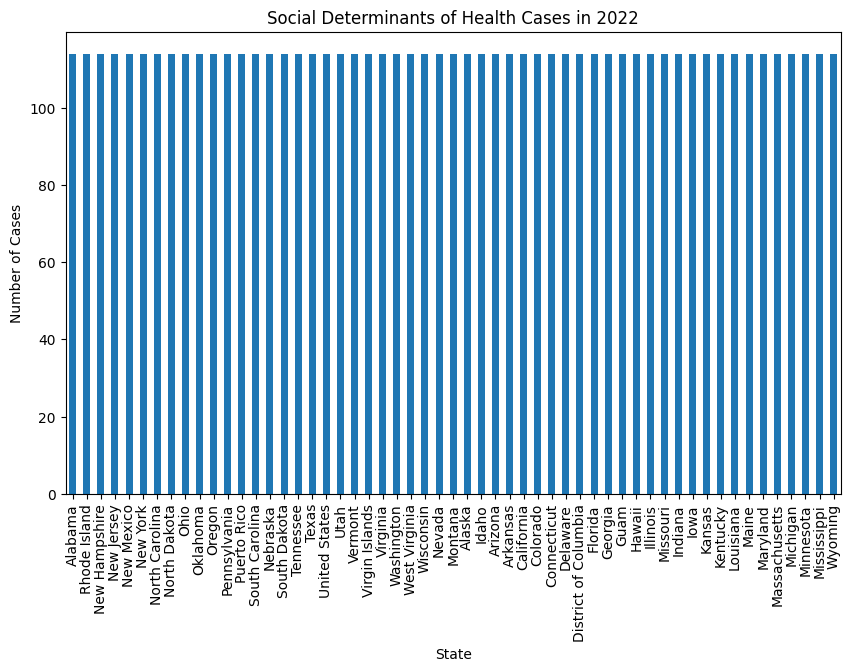

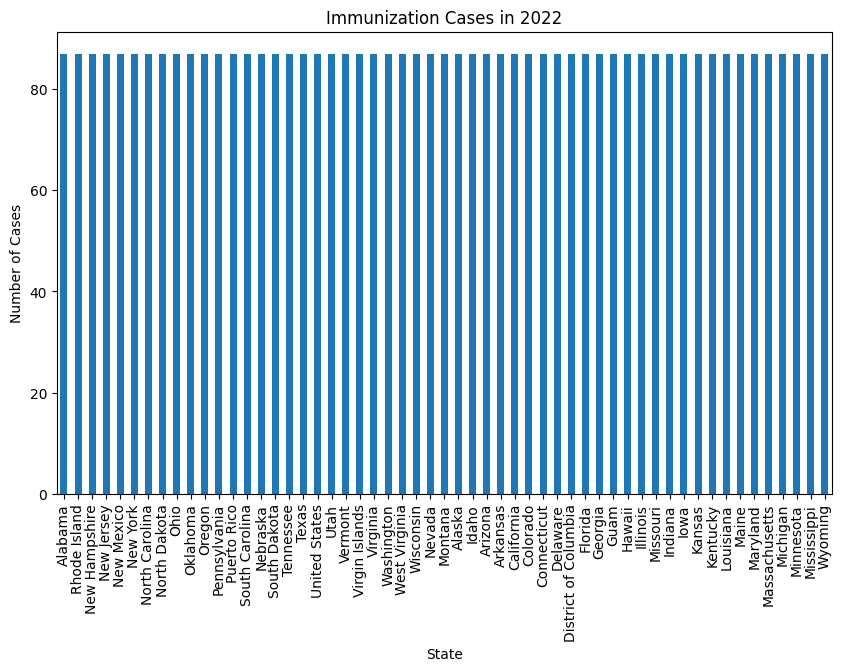

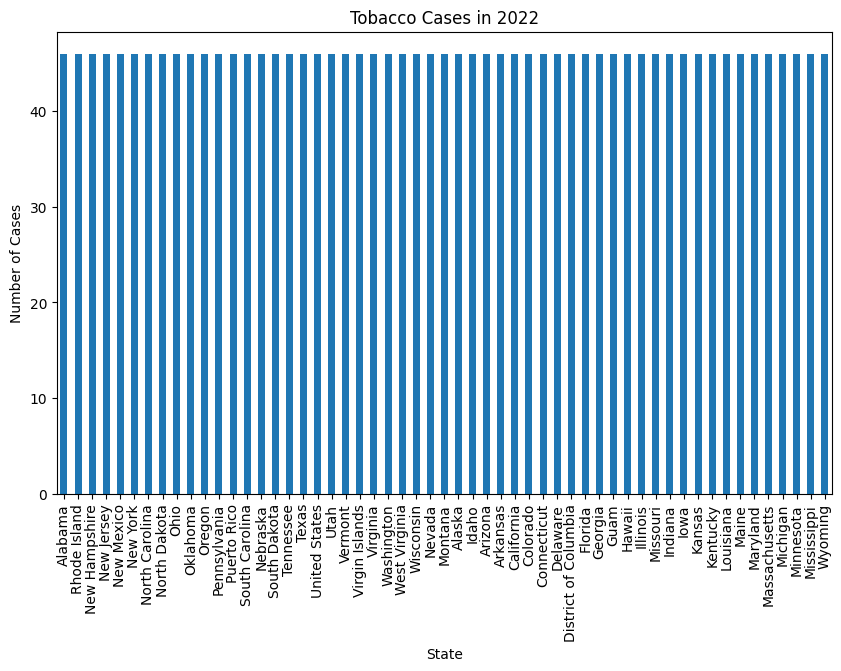

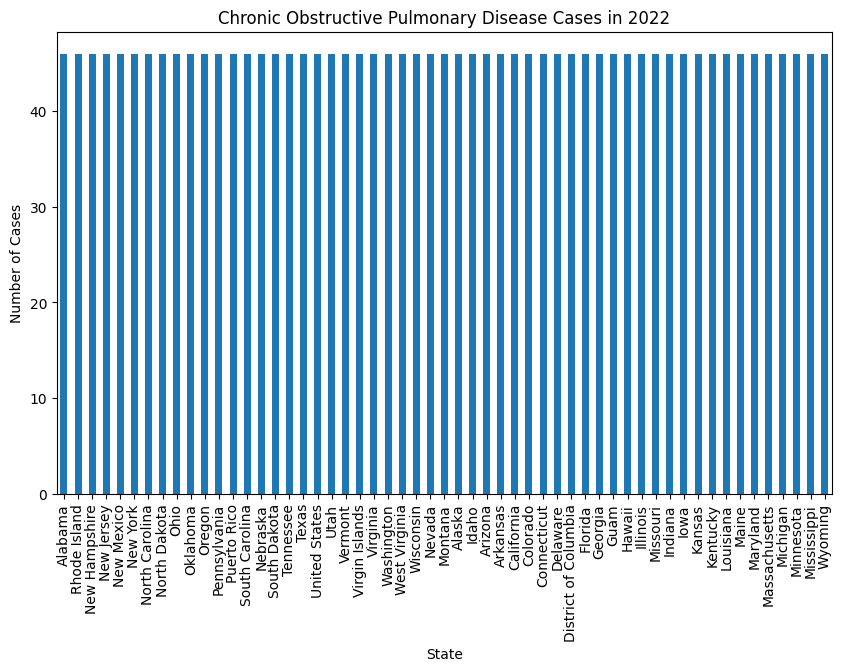

In [ ]:
# state case counts by disease topics and years

# Loop through each year
for year in range(2010, 2023):
    # Filter the DataFrame for the current year
    year_data = combined_df[combined_df['YearStart'] == year]

    # Get the unique topics for the current year
    unique_topics = year_data['Topic'].unique()

    # Loop through each topic
    for topic in unique_topics:
        # Filter the data for the current topic
        topic_data = year_data[year_data['Topic'] == topic]

        # Group by state and count the occurrences
        state_counts = topic_data.groupby('LocationDesc').size()

        # Sort the counts from largest to smallest
        state_counts = state_counts.sort_values(ascending=False)

        # Create the plot
        plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
        state_counts.plot(kind='bar')

        # Set the title and labels
        plt.title(f'{topic} Cases in {year}')
        plt.xlabel('State')
        plt.ylabel('Number of Cases')

        # Rotate the x-axis labels to be vertical
        plt.xticks(rotation=90)

        # Show the plot
        plt.show()


In [ ]:
state_counts1 = combined_df['LocationDesc'].value_counts()
state_year_group1 = combined_df.groupby(['LocationDesc', 'YearStart','Topic','Question']).size()

In [ ]:
chronic_kidney = combined_df[combined_df['Topic'] == 'Chronic Kidney Disease']
location_counts = chronic_kidney.groupby(['YearStart','LocationDesc','Topic','Question']).size()
location_counts

YearStart  LocationDesc   Topic                   Question                                                          
2010       Alabama        Chronic Kidney Disease  mortality with end-stage renal disease                                3
           Alaska         Chronic Kidney Disease  mortality with end-stage renal disease                                3
           Arizona        Chronic Kidney Disease  mortality with end-stage renal disease                                3
           Arkansas       Chronic Kidney Disease  mortality with end-stage renal disease                                3
           California     Chronic Kidney Disease  mortality with end-stage renal disease                                3
                                                                                                                       ..
2021       Virginia       Chronic Kidney Disease  prevalence of chronic kidney disease among adults aged >= 18 years    2
           Washington     Chr